#**ML Project: Predicting Mortgage Interest Rate In The U.S.**

When a lender is providing a mortgage loan, certain factors are taken into consideration. There are two main assessments to be conducted: 1) Market assessment of real estate economy conditions and current market rates, which include factors such as GDP, Unemployment Rate, and House Price Index. 2) Borrower assessment which include Outstanding Balance, FICO score and LTV ratio. The purpose of this project is to execute a supervised learning model to predict the interest rate based on those features.

# **Description**

The data set has about 50,000 total mortgage borrowers over a 60 period time totalling to >600,000 instances of application. It has 23 features with a mix of categorical and continuous variables. We would like to run  supervised learning algorithms (possibly Regression models) to see if we can build a model to predict the "interest_rate" based on the listed features like GDP at time of Application, Outstanding Balance, house price.


Website dataset Description:
"The data set mortgage is in panel form and reports origination and performance observations for 50,000 residential U.S. mortgage borrowers over 60 periods. The periods have been deidentified. As in the real world, loans may originate before the start of the observation period (this is an issue where loans are transferred between banks and investors as in securitization). The loan observations may thus be censored as the loans mature or borrowers refinance. The data set is a randomized selection of mortgage-loan-level data collected from the portfolios underlying U.S. residential mortgage-backed securities (RMBS) securitization portfolios and provided by International Financial Research."

**Key Variables:**


*   id: Borrower ID
*   time: Time stamp of observation
*   orig_time: Time stamp for origination
*   first_time: Time stamp for first observation
*   mat_time: Time stamp for maturity
*   balance_time: Outstanding balance at observation time
*   LTV_time: Loan-to-value ratio at observation time, in %
*   interest_rate_time: Interest rate at observation time, in % (TARGET/LABEL)
*   hpi_time: House price index at observation time, base year = 100
*   gdp_time: Gross domestic product (GDP) growth at observation time, in %
*   uer_time: Unemployment rate at observation time, in %
*   REtype_CO_orig_time: Real estate type condominium = 1, otherwise = 0  (Categorical)
*   REtype_PU_orig_time: Real estate type planned urban development = 1, otherwise = 0 (Categorical)
*   REtype_SF_orig_time: Single-family home = 1, otherwise = 0 (Categorical)
*   investor_orig_time: Investor borrower = 1, otherwise = 0 (Categorical)
*   balance_orig_time: Outstanding balance at origination time
*   FICO_orig_time: FICO score at origination time, in %
*   LTV_orig_time: Loan-to-value ratio at origination time, in %
*   Interest_Rate_orig_time: Interest rate at origination time, in %
*   hpi_orig_time: House price index at origination time, base year = 100
*   default_time: Default observation at observation time (Categorical)
*   payoff_time: Payoff observation at observation time (Categorical)
*   status_time: Default (1), payoff (2), and nondefault/nonpayoff (0) observation at observation time (Categorical)





#**Run The Following Three Cells To Work on Data**

In [ ]:
import numpy as np
import pandas as pd 
import os 
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [ ]:
# Mount Google Drive
from google.colab import drive 
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# Please make sure the file path is set to your drive folder
# Link the file path to mortgage.csv and name it "df_mortgage"
link = '/content/gdrive/MyDrive/Colab Notebooks/ML Project 2/mortgage.csv'
df_mortgage =pd.read_csv(link)


#Data Preprocessing and Exploratory Analysis

Initially, the necessary pre-processing libraries and packages are imported. Checking for some descriptive statistics; histograms, outliers and null values is performed. Additionally, analysis such as multi-collinearity, feature scaling required and encoding are addressed.

In [ ]:
# Checking to see the first few rows of the dataframe
df_mortgage.head()

,id,time,orig_time,first_time,mat_time,balance_time,LTV_time,interest_rate_time,hpi_time,gdp_time,uer_time,REtype_CO_orig_time,REtype_PU_orig_time,REtype_SF_orig_time,investor_orig_time,balance_orig_time,FICO_orig_time,LTV_orig_time,Interest_Rate_orig_time,hpi_orig_time,default_time,payoff_time,status_time
0,1,25,-7,25,113,41303.42,24.498336,9.2,226.29,2.899137,4.7,0,0,1,0,45000.0,715,69.4,9.2,87.03,0,0,0
1,1,26,-7,25,113,41061.95,24.483867,9.2,225.10,2.151365,4.7,0,0,1,0,45000.0,715,69.4,9.2,87.03,0,0,0
2,1,27,-7,25,113,40804.42,24.626795,9.2,222.39,2.361722,4.4,0,0,1,0,45000.0,715,69.4,9.2,87.03,0,0,0
3,1,28,-7,25,113,40483.89,24.735883,9.2,219.67,1.229172,4.6,0,0,1,0,45000.0,715,69.4,9.2,87.03,0,0,0
4,1,29,-7,25,113,40367.06,24.925476,9.2,217.37,1.692969,4.5,0,0,1,0,45000.0,715,69.4,9.2,87.03,0,0,0


In [ ]:
# Checking some properties of the data such as type, null values
df_mortgage.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 622489 entries, 0 to 622488
Data columns (total 23 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   id                       622489 non-null  int64  
 1   time                     622489 non-null  int64  
 2   orig_time                622489 non-null  int64  
 3   first_time               622489 non-null  int64  
 4   mat_time                 622489 non-null  int64  
 5   balance_time             622489 non-null  float64
 6   LTV_time                 622219 non-null  float64
 7   interest_rate_time       622489 non-null  float64
 8   hpi_time                 622489 non-null  float64
 9   gdp_time                 622489 non-null  float64
 10  uer_time                 622489 non-null  float64
 11  REtype_CO_orig_time      622489 non-null  int64  
 12  REtype_PU_orig_time      622489 non-null  int64  
 13  REtype_SF_orig_time      622489 non-null  int64  
 14  inve

In [ ]:
# Checking some descriptive statistics of the data
df_mortgage.describe()

,id,time,orig_time,first_time,mat_time,balance_time,LTV_time,interest_rate_time,hpi_time,gdp_time,uer_time,REtype_CO_orig_time,REtype_PU_orig_time,REtype_SF_orig_time,investor_orig_time,balance_orig_time,FICO_orig_time,LTV_orig_time,Interest_Rate_orig_time,hpi_orig_time,default_time,payoff_time,status_time
count,622489.000000,622489.000000,622489.000000,622489.000000,622489.000000,6.224890e+05,622219.000000,622489.000000,622489.00000,622489.000000,622489.000000,622489.000000,622489.000000,622489.000000,622489.000000,6.224890e+05,622489.000000,622489.000000,622489.000000,622489.000000,622489.000000,622489.000000,622489.000000
mean,25147.492561,35.800806,20.570057,24.607362,137.206527,2.459649e+05,83.078239,6.702451,184.10245,1.381032,6.517327,0.067596,0.124834,0.612067,0.138226,2.562539e+05,673.616922,78.975460,5.649546,198.115217,0.024351,0.042714,0.109779
std,13750.200051,11.579971,7.615170,6.739015,19.532501,2.141563e+05,24.968839,2.079246,27.65077,1.964645,1.921425,0.251052,0.330531,0.487280,0.345137,2.197181e+05,71.724558,10.127052,2.978061,33.964785,0.154135,0.202212,0.427967
min,1.000000,1.000000,-40.000000,1.000000,18.000000,0.000000e+00,0.000000,0.000000,107.83000,-4.146711,3.800000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,400.000000,50.100000,0.000000,75.710000,0.000000,0.000000,0.000000
25%,13580.000000,27.000000,18.000000,21.000000,137.000000,1.020174e+05,67.109446,5.650000,158.60000,1.104163,4.700000,0.000000,0.000000,0.000000,0.000000,1.080000e+05,626.000000,75.000000,5.000000,179.450000,0.000000,0.000000,0.000000
50%,24881.000000,34.000000,22.000000,25.000000,142.000000,1.806183e+05,82.253269,6.625000,180.52000,1.850689,5.700000,0.000000,0.000000,1.000000,0.000000,1.880000e+05,678.000000,80.000000,6.290000,216.770000,0.000000,0.000000,0.000000
75%,37045.000000,44.000000,25.000000,28.000000,145.000000,3.374950e+05,100.634381,7.875000,212.73000,2.694111,8.200000,0.000000,0.000000,1.000000,0.000000,3.520000e+05,729.000000,80.000000,7.456000,222.390000,0.000000,0.000000,0.000000
max,50000.000000,60.000000,60.000000,60.000000,229.000000,8.701859e+06,803.513550,37.500000,226.29000,5.132464,10.000000,1.000000,1.000000,1.000000,1.000000,8.000000e+06,840.000000,218.500000,19.750000,226.290000,1.000000,1.000000,2.000000


#Heatmap to Check for Null Values

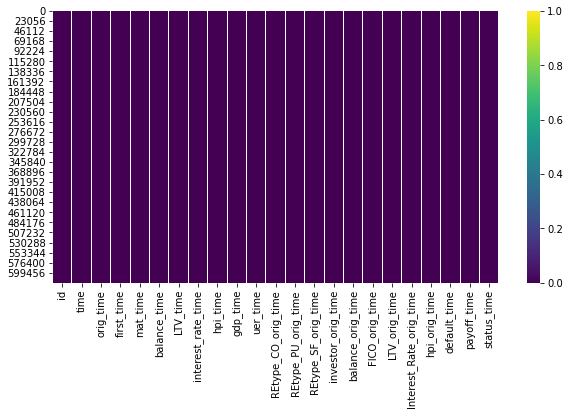

In [ ]:
# Checking for null values, dataset is clean in terms of null values, but abnormalities such as outliers are still to be checked
fig, ax = plt.subplots(figsize=(10,5))
sns.heatmap(df_mortgage.isnull(), cmap='viridis')

#Correlation plot to check for Multi-Collinearity.

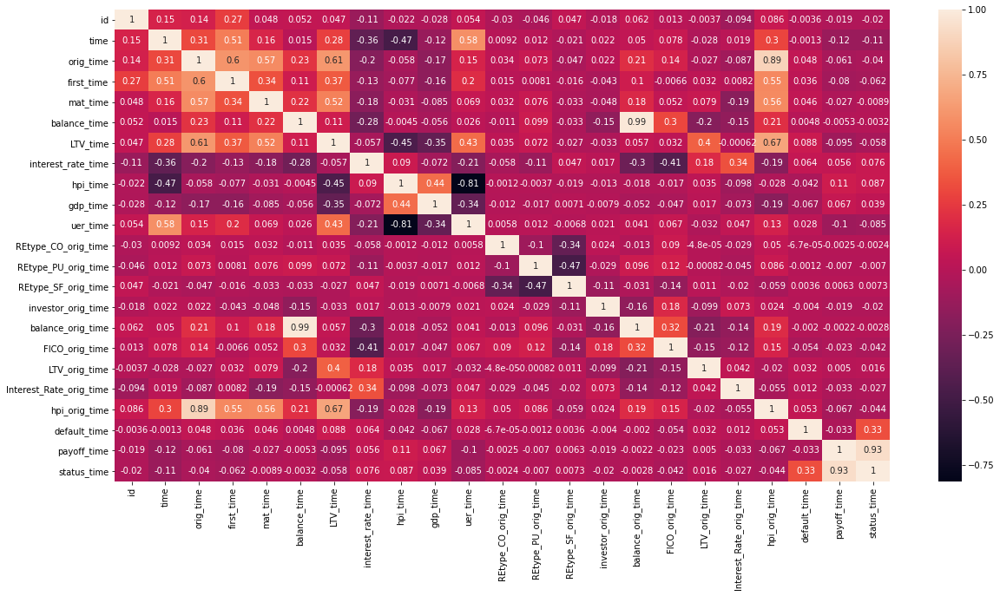

In [ ]:
# Now to look at the correlation between variables
plt.figure(figsize=(20,10))
sns.heatmap(df_mortgage.corr('pearson'), annot=True)

#Checking Relationships between the various Features and between the Features and the Label / Target variable (interest_rate_time)

In [ ]:
# Scatter Plot to check the Linear Relationship between the two features with very high correlation
# There is a strong Linear Relationship between the features but a non-linear relationship with the target / y-label
fig = px.scatter(df_mortgage, x="balance_time", y="balance_orig_time",
                 size="interest_rate_time")
fig.show()

**Checking correlation on features from the heatmap**

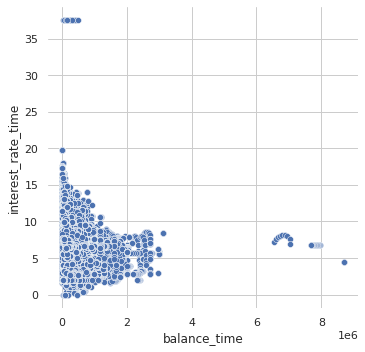

In [ ]:
# ScatterPlot to show the non-linear relation between the feature balance_time and the y label interest_rate_time
# As there is non-linear relationships between the features and the y-label, a simple Linear Regression would not be appropriate
sns.set_theme(style="whitegrid")

cmap = sns.cubehelix_palette(rot=0, as_cmap=True)
g = sns.relplot(
    data=df_mortgage,
    x="balance_time", y="interest_rate_time",
    palette=cmap, sizes=(10, 200),
)
g.ax.xaxis.grid(True, "minor", linewidth=.25)
g.ax.yaxis.grid(True, "minor", linewidth=.25)
g.despine(left=True, bottom=True)

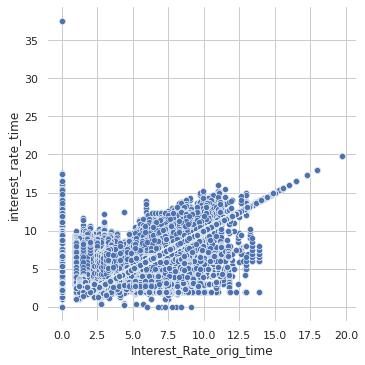

In [ ]:
cmap = sns.cubehelix_palette(rot=0, as_cmap=True)
g = sns.relplot(
    data=df_mortgage,
    x="Interest_Rate_orig_time", y="interest_rate_time",
    palette=cmap, sizes=(10, 200),
)
g.ax.xaxis.grid(True, "minor", linewidth=.25)
g.ax.yaxis.grid(True, "minor", linewidth=.25)
g.despine(left=True, bottom=True)

In [ ]:
#checking which interest rate that are fixed vs. which interest rates are variable

print("Instances where interest rate is fixed:", sum(df_mortgage['interest_rate_time'] == df_mortgage['Interest_Rate_orig_time']))
print("Instances where interest rate is variable:", sum(df_mortgage['interest_rate_time'] != df_mortgage['Interest_Rate_orig_time']))

Instances where interest rate is fixed: 435407
Instances where interest rate is variable: 187082


69.95% of the dataset have interest rates that are fixed, meaning the interest during the origination and observation times are the same. It would therefore simplify the model if **we add a feature that would indicate which interest rates are fixed and variable during the observation time.**

For mortgage loans, interest rates are either fixed, variable or hybrid (fixed and variable). Whether the interest is fixed or variable for an observation period (or payment month) is a feature that the bank/lender likely determines.

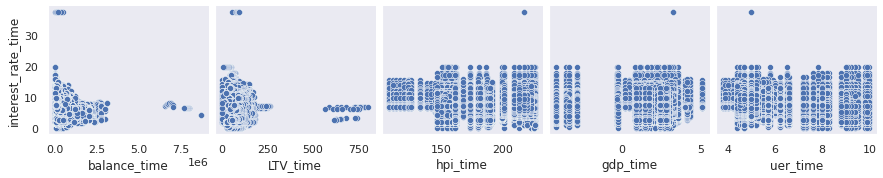

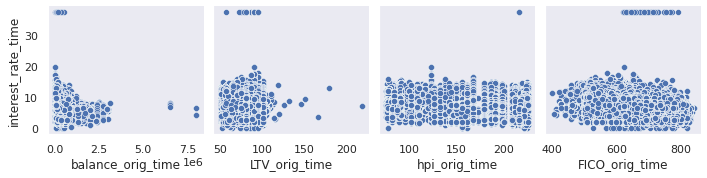

In [ ]:
# Plot to see relationship between similar features such as balance, LTV and hpi and the Target variable (interest_rate_time)
sns.set_context("paper")
sns.set_theme(style="dark")
figsize = (15,10)
# Plot 1
sns.pairplot(data=df_mortgage, x_vars=['balance_time','LTV_time','hpi_time','gdp_time','uer_time'], y_vars='interest_rate_time')
# Plot 2
sns.pairplot(data=df_mortgage, x_vars=['balance_orig_time','LTV_orig_time','hpi_orig_time','FICO_orig_time'], y_vars='interest_rate_time')

Text(0.5, 1.0, 'orig_time vs. hpi_orig_time ')

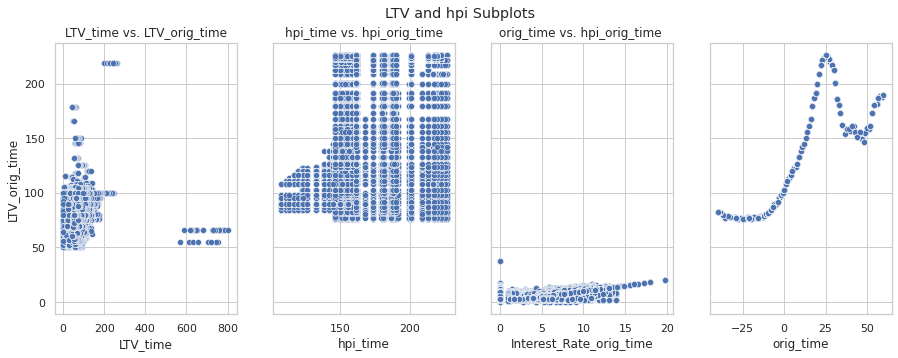

In [ ]:
# Plotting the Relationships between the LTV , hpi and interest_rate_time features for feature selection
sns.set_context('paper')
sns.set_theme(style='whitegrid')
fig, axes = plt.subplots(1, 4, figsize=(15, 5), sharey=True)
fig.suptitle('LTV and hpi Subplots')

# SubPlot 1
sns.scatterplot(ax=axes[0], x=df_mortgage["LTV_time"], y=df_mortgage["LTV_orig_time"])
axes[0].set_title('LTV_time vs. LTV_orig_time')

# SubPlot 2
sns.scatterplot(ax=axes[1], x=df_mortgage["hpi_time"], y=df_mortgage["hpi_orig_time"])
axes[1].set_title('hpi_time vs. hpi_orig_time')

# SubPlot 3
sns.scatterplot(ax= axes[2], x=df_mortgage["Interest_Rate_orig_time"], y=df_mortgage["interest_rate_time"])
axes[2].set_title('Interest_Rate_orig_time vs. interest_rate_time ')

# SubPlot 4
sns.scatterplot(ax= axes[3], x=df_mortgage["orig_time"], y=df_mortgage["hpi_orig_time"])
axes[2].set_title('orig_time vs. hpi_orig_time ')

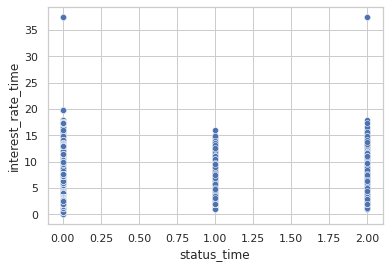

In [ ]:
# Categorical variable status_time vs. Target Variable
sns.scatterplot(data = df_mortgage, x='status_time', y='interest_rate_time')

#Histogram to determine different features' distributions
Since we are not using Linear Regression, we do not transform non-normally distributed data. The below histograms show the ditributions of different features

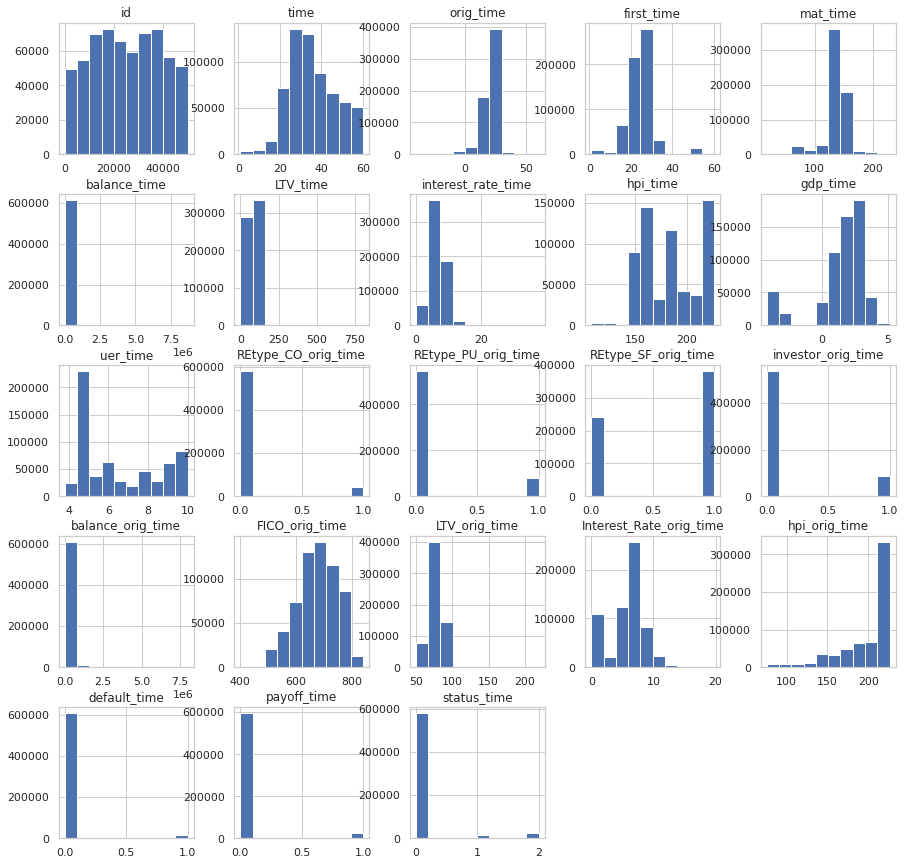

In [ ]:
# Looking at the distributions of the different features
df_mortgage.hist(figsize=(15,15))
plt.show()

#Box Plot to determine outliers and assess features accordingly.
Based on the initial selected features to build the model, the outliers are considered valuable information that provide insight, such as that of high Outstanding Balance (balance_time) or high Loan to Value Ratio (LTV) borrowers. Therefore, outliers are to be used in the Machine Learning model and an appropriate Feature Scaling Technique is to be used accordingly.

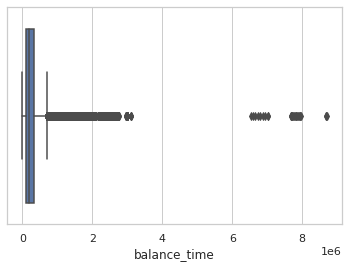

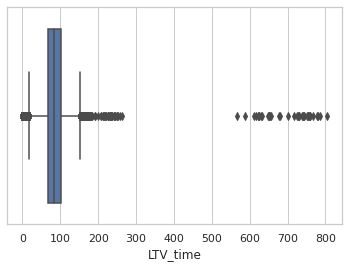

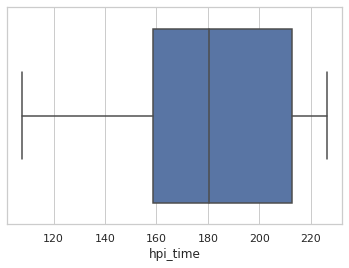

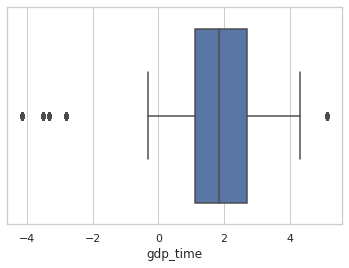

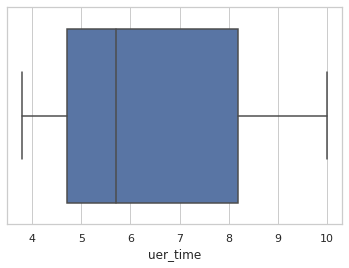

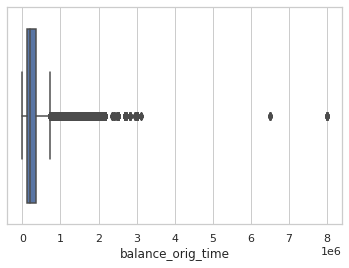

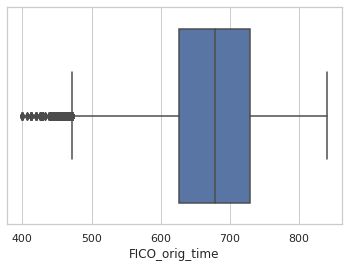

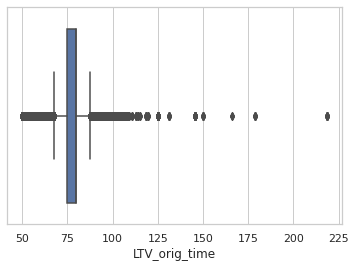

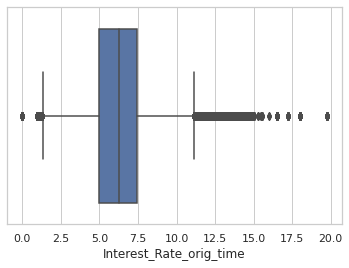

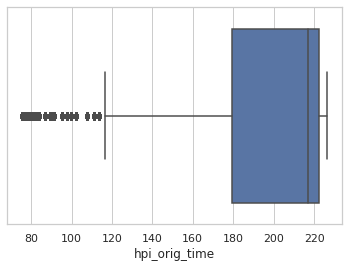

In [ ]:
# Box Plot for Continuous Variables
column = ['balance_time','LTV_time','hpi_time','gdp_time','uer_time','balance_orig_time','FICO_orig_time','LTV_orig_time','Interest_Rate_orig_time','hpi_orig_time']
for columns in column:
    plt.figure()
    sns.boxplot(data=df_mortgage, x=columns)

#**RUN CELLS FROM HERE to Train the models**

#Preparing the selected features to be used for training.

**Key features included:**

*   orig_time: Time stamp for origination
*   first_time: Time stamp for first observation
*   interest_rate_time: Interest rate at observation time, in % (TARGET/LABEL)
*   balance_time: Outstanding balance at observation time
*   LTV_time: Loan-to-value ratio at observation time, in %
*   hpi_time: House price index at observation time, base year = 100
*   gdp_time: Gross domestic product (GDP) growth at observation time, in %
*   uer_time: Unemployment rate at observation time, in %
*   REtype_CO_orig_time: Real estate type condominium = 1, otherwise = 0  (Categorical)
*   REtype_PU_orig_time: Real estate type planned urban development = 1, otherwise = 0 (Categorical)
*   REtype_SF_orig_time: Single-family home = 1, otherwise = 0 (Categorical)
*   investor_orig_time: Investor borrower = 1, otherwise = 0 (Categorical)
*   FICO_orig_time: FICO score at origination time, in %
*   LTV_orig_time: Loan-to-value ratio at origination time, in %
*   Interest_Rate_orig_time: Interest rate at origination time, in %
*   hpi_orig_time: House price index at origination time, base year = 100
*   status_time: Default (1), payoff (2), and nondefault/nonpayoff (0) observation at observation time (Categorical)

In [ ]:
# This is the modified dataset to be used in the model
df_new = df_mortgage[['orig_time','first_time','balance_time','LTV_time','LTV_orig_time','hpi_time','hpi_orig_time','gdp_time','uer_time','REtype_CO_orig_time','REtype_PU_orig_time','REtype_SF_orig_time','investor_orig_time','status_time','FICO_orig_time','Interest_Rate_orig_time','interest_rate_time']]

#Here we combine the LTV orig and obs features into one feature, as well as hpi orig and obs features into one feature.

In [ ]:
# First we combine LTV_time and LTV_orig_time into one feature, and also hpi_time and hpi_orig_time into another feature
# Since there seems to be a relation between LTV and hpi at times of origination and observation, the new features are a ratio of the two

first_obs_minus_orig_time = (df_new['first_time'] - df_new['orig_time']) # Difference between First Observation time and Origination time
LTV_orig_obs_ratio = (df_new['LTV_time'] / df_new['LTV_orig_time']) * 100 # If you want to change this division relation you could do so (add, subtract, etc...)
hpi_orig_obs_ratio = (df_new['hpi_time'] / df_new['hpi_orig_time']) * 100 # If you want to change this division relation you could do so (add, subtract, etc...)
fixed_interest_rate = np.where((df_new['interest_rate_time'] == df_new['Interest_Rate_orig_time']),1,0)

# A new dataframe with the combine LTV and hpi features
new_ratios = pd.DataFrame({'first_obs_minus_orig_time':first_obs_minus_orig_time,'LTV_orig_obs_ratio':LTV_orig_obs_ratio, 'hpi_orig_obs_ratio':hpi_orig_obs_ratio, 'fixed_interest_rate': fixed_interest_rate})
df_new2 = df_new.drop(['orig_time','first_time','LTV_time','LTV_orig_time','hpi_time','hpi_orig_time'], axis=1)
df_new2 = df_new2.join(new_ratios)
first_col = df_new2.pop('first_obs_minus_orig_time') # Changing this column to put in the first column for a better looking table
df_new2.insert(0,'first_obs_minus_orig_time', first_col) # Putting the popped column in the first column

In [ ]:
# Making sure no Null Values exist
df_new2 = df_new2.dropna()
df_new2.head()

,first_obs_minus_orig_time,balance_time,gdp_time,uer_time,REtype_CO_orig_time,REtype_PU_orig_time,REtype_SF_orig_time,investor_orig_time,status_time,FICO_orig_time,Interest_Rate_orig_time,interest_rate_time,LTV_orig_obs_ratio,hpi_orig_obs_ratio,fixed_interest_rate
0,32,41303.42,2.899137,4.7,0,0,1,0,0,715,9.2,9.2,35.300196,260.013788,1
1,32,41061.95,2.151365,4.7,0,0,1,0,0,715,9.2,9.2,35.279348,258.646444,1
2,32,40804.42,2.361722,4.4,0,0,1,0,0,715,9.2,9.2,35.485295,255.532575,1
3,32,40483.89,1.229172,4.6,0,0,1,0,0,715,9.2,9.2,35.642483,252.407216,1
4,32,40367.06,1.692969,4.5,0,0,1,0,0,715,9.2,9.2,35.915671,249.764449,1


In [ ]:
# Checking to make sure no Null Values exist
df_new2.isnull().any()

first_obs_minus_orig_time    False
balance_time                 False
gdp_time                     False
uer_time                     False
REtype_CO_orig_time          False
REtype_PU_orig_time          False
REtype_SF_orig_time          False
investor_orig_time           False
status_time                  False
FICO_orig_time               False
Interest_Rate_orig_time      False
interest_rate_time           False
LTV_orig_obs_ratio           False
hpi_orig_obs_ratio           False
fixed_interest_rate          False
dtype: bool

In [ ]:
# Checking the new dataframe
df_new2.shape

(622219, 15)

#Now we separate the predictors and the target variable

In [ ]:
# Importing necessary libraries
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer 
from sklearn.preprocessing import OneHotEncoder, StandardScaler

In [ ]:
# Separating the numerical and categorical variables
TARGET = 'interest_rate_time'

columns_predictors = [col for col in df_new2.columns if col not in [TARGET]]
columns_categorical = ['REtype_CO_orig_time','REtype_PU_orig_time','REtype_SF_orig_time','investor_orig_time','status_time', 'fixed_interest_rate']
columns_numerical = [col for col in columns_predictors if col not in columns_categorical]

print(f"TARGET: {TARGET}")
print(f"columns_predictors: {columns_predictors}")
print(f"columns_categorical: {columns_categorical}")
print(f"columns_numerical: {columns_numerical}")

TARGET: interest_rate_time
columns_predictors: ['first_obs_minus_orig_time', 'balance_time', 'gdp_time', 'uer_time', 'REtype_CO_orig_time', 'REtype_PU_orig_time', 'REtype_SF_orig_time', 'investor_orig_time', 'status_time', 'FICO_orig_time', 'Interest_Rate_orig_time', 'LTV_orig_obs_ratio', 'hpi_orig_obs_ratio', 'fixed_interest_rate']
columns_categorical: ['REtype_CO_orig_time', 'REtype_PU_orig_time', 'REtype_SF_orig_time', 'investor_orig_time', 'status_time', 'fixed_interest_rate']
columns_numerical: ['first_obs_minus_orig_time', 'balance_time', 'gdp_time', 'uer_time', 'FICO_orig_time', 'Interest_Rate_orig_time', 'LTV_orig_obs_ratio', 'hpi_orig_obs_ratio']


# **The Predictors and Target variables**

In [ ]:
# The predictors and TARGET variable
X = df_new2[columns_predictors]
y = df_new2[TARGET]

# We start splitting the data into train/test and applying the feature scaling and encoding pipelines

In [ ]:
# Splitting the data into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=10086)

print(f"X_train.shape: {X_train.shape}")
print(f"X_test.shape: {X_test.shape}")
print(f"y_train.shape: {y_train.shape}")
print(f"y_test.shape: {y_test.shape}")

X_train.shape: (466664, 14)
X_test.shape: (155555, 14)
y_train.shape: (466664,)
y_test.shape: (155555,)


In [ ]:
# Convert the non transformed Dataframe into list and Create numerical pipeline to transform numerical values
# Note StandardScaler was applied as Outliers were thought to represent an important population and hence was left in the data
# MinMax Scaler would have been very sensitive to Outliers

columns_categorical_list = list(columns_categorical)
columns_numerical_list = list(columns_numerical)

pipeline_categorical = Pipeline([
  ('onehot', OneHotEncoder()),
])

pipeline_numerical = Pipeline([
  ('scaler', StandardScaler()),
])

pipeline_full = ColumnTransformer([
  ("categorical", pipeline_categorical, columns_categorical_list),
  ("numerical", pipeline_numerical, columns_numerical_list),
])

In [ ]:
feature_names = ['REtype_CO_orig_time_0', 'REtype_CO_orig_time_1', 
                 'REtype_PU_orig_time_0', 'REtype_PU_orig_time_1', 
                 'REtype_SF_orig_time_0', 'REtype_SF_orig_time_1', 
                 'investor_orig_time_0', 'investor_orig_time_1', 
                 'non_payoff_non_default', 'default', 'payoff', 'var_interest', 'fixed_interest'] + columns_numerical_list

In [ ]:
# Using Feature Union to merge both categorical and numerical features
pipeline_full.fit(X_train) # This is only fitted once on X_train and applied on X_test, you do not fit it twice
X_train_transformed = pipeline_full.transform(X_train)
X_test_transformed = pipeline_full.transform(X_test)
print(f"X_train_transformed.shape: {X_train_transformed.shape}")
print(f"X_test_transformed.shape: {X_test_transformed.shape}")

X_train_transformed.shape: (466664, 21)
X_test_transformed.shape: (155555, 21)


# Now we have **X_train_transformed, y_train, X_test_transformed and y_test** to implement the training, cross-validation and testing of different Machine Learning models

#**Note, please only re-run the model to be used for testing since the computation time could be high**

In [ ]:
#Import model training and validation libraries
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.svm import LinearSVR
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import VotingRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV, cross_val_score

In [ ]:
#define function to evaluate cross validation scores
def display_scores(scores):
  print("Validation Scores: ", scores)
  print("Validation Score Mean: ", scores.mean())
  print("Validation Score Standard Deviation: ", scores.std())

## Train, cross-validate and test various regressors

In [ ]:
#Train and cross validate, test a Linear Regression Model - The model has a high RMSE as we have non-linear relationships with target variable
linregressor = LinearRegression()
linregressor.fit(X_train_transformed, y_train)
linpred_y_train = linregressor.predict(X_train_transformed)
linear_scores = cross_val_score(linregressor, X_train_transformed, y_train, scoring = "neg_mean_squared_error", cv =10 )
linear_rmse_scores = np.sqrt(-linear_scores)
linpred_y_test = linregressor.predict(X_test_transformed)
print("RMSE of Linear regressor on train dataset is:",np.sqrt(mean_squared_error(y_train, linpred_y_train)))
display_scores(linear_rmse_scores)
print("RMSE of Linear regressor on test dataset is:",np.sqrt(mean_squared_error(y_test, linpred_y_test)))

RMSE of Linear regressor on train dataset is: 1.649209913044208
Validation Scores:  [1.64927065 1.64453693 1.66812861 1.64773427 1.63536514 1.65291914
 1.68171993 1.63010892 1.63939603 1.64380512]
Validation Score Mean:  1.6492984730955922
Validation Score Standard Deviation:  0.014610155109011551
RMSE of Linear regressor on test dataset is: 1.6463818827246832


In [ ]:
#Similar to the previous linear model, RMSE is high since non-linear relationships exist with the target variable
#Train and cross validate LinearSVR
linsvr = LinearSVR(epsilon = 1.5)
linsvr.fit(X_train_transformed, y_train)
linsvrpred_y_train = linsvr.predict(X_train_transformed)
linsvrscores = cross_val_score(linsvr, X_train_transformed, y_train, scoring = "neg_mean_squared_error", cv =10 )
linsvr_rmse_scores = np.sqrt(-linsvrscores)
linsvrpred_y_test = linsvr.predict(X_test_transformed)
print("RMSE of Linear SVR regressor on train dataset is:",np.sqrt(mean_squared_error(y_train, linsvrpred_y_train)))
display_scores(linsvr_rmse_scores)
print("RMSE of Linear SVR regressor on test dataset is:",np.sqrt(mean_squared_error(y_test, linsvrpred_y_test)))

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.

/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning:

Li

RMSE of Linear SVR regressor on train dataset is: 1.6547280980508274
Validation Scores:  [1.65111078 1.64830471 1.6713985  1.65380222 1.64331088 1.66247617
 1.68800885 1.63627228 1.64574528 1.64754521]
Validation Score Mean:  1.654797488146005
Validation Score Standard Deviation:  0.014505008199273936
RMSE of Linear SVR regressor on test dataset is: 1.6525464999510013


/usr/local/lib/python3.7/dist-packages/sklearn/svm/_base.py:947: ConvergenceWarning:

Liblinear failed to converge, increase the number of iterations.



In [ ]:
#Train a Mult-Variate Linear Regression Model
#As we add more degrees, the error might decrease but the model could be prone to overfitting.
#The system crashes with any degree higher than 2 due to RAM, therefore another model is to be analyzed.
#It could be better to use SVR with a polynomial kernel to mitigate this issue (implemented below)

#for degree in range (2,6):
poly_features = PolynomialFeatures(degree=2, include_bias=False)
X_poly_train = poly_features.fit_transform(X_train_transformed)
X_poly_test = poly_features.fit_transform(X_test_transformed)
linpolyregressor = LinearRegression()
linpolyregressor.fit(X_poly_train, y_train)
linpolypred_y_train = linpolyregressor.predict(X_poly_train)
linpoly_scores = cross_val_score(linpolyregressor, X_poly_train, y_train, scoring = "neg_mean_squared_error", cv =10 )
linpoly_rmse_scores = np.sqrt(-linpoly_scores)
linpolypred_y_test = linpolyregressor.predict(X_poly_test)
print("RMSE of Linear regressor with Polynomial Features on train dataset is:",np.sqrt(mean_squared_error(y_train, linpolypred_y_train)))
display_scores(linpoly_rmse_scores)
print("RMSE of Linear regressor with Polynomial Features on test dataset is:",np.sqrt(mean_squared_error(y_test, linpolypred_y_test)))

RMSE of Linear regressor with Polynomial Features on train dataset is: 0.9825967752440778
Validation Scores:  [0.98778299 0.96109081 1.01422129 0.98146527 0.95405456 0.98939975
 1.02256382 0.96266507 0.97720614 0.98127519]
Validation Score Mean:  0.9831724884329031
Validation Score Standard Deviation:  0.020913776993326964
RMSE of Linear regressor with Polynomial Features on test dataset is: 0.9769114729441185


In [ ]:
#Train and cross validate with Decision Tree Regressor
treeregressor = DecisionTreeRegressor()
treeregressor.fit(X_train_transformed, y_train)
treereg_y_train = treeregressor.predict(X_train_transformed)
treereg_scores = cross_val_score(treeregressor, X_train_transformed, y_train, scoring = "neg_mean_squared_error", cv =10 )
treereg_rmse_scores = np.sqrt(-treereg_scores)
treereg_y_test = treeregressor.predict(X_test_transformed)
print("RMSE of Decision Tree regressor on train dataset is:",np.sqrt(mean_squared_error(y_train, treereg_y_train)))
display_scores(treereg_rmse_scores)
print("RMSE of Decision Tree regressor on test dataset is:",np.sqrt(mean_squared_error(y_test, treereg_y_test)))

RMSE of Decision Tree regressor on train dataset is: 0.00013680009675046505
Validation Scores:  [0.62280964 0.60583507 0.67610173 0.63177783 0.615315   0.65718547
 0.68062323 0.61049171 0.63085084 0.68101803]
Validation Score Mean:  0.6412008548057128
Validation Score Standard Deviation:  0.02830394254425852
RMSE of Decision Tree regressor on test dataset is: 0.6144370657331822


In [ ]:
#GridSearchCV for Decision Tree Regressor
param_grid_treereg = {'max_features': [None, 16, 10], 'max_depth': [None, 30, 25, 20]}
grid_search_treereg = GridSearchCV(DecisionTreeRegressor(), param_grid_treereg, scoring='neg_mean_squared_error', return_train_score=True)
grid_search_treereg.fit(X_train_transformed, y_train)
cvres_treereg = grid_search_treereg.cv_results_
for mean_score, params in zip(cvres_treereg["mean_test_score"], cvres_treereg["params"]):
  print(np.sqrt(-mean_score), params)

0.6605068774260275 {'max_depth': None, 'max_features': None}
0.6798059720933012 {'max_depth': None, 'max_features': 16}
0.7100022694984858 {'max_depth': None, 'max_features': 10}
0.6601173778239963 {'max_depth': 30, 'max_features': None}
0.6747461410580903 {'max_depth': 30, 'max_features': 16}
0.7163659593500354 {'max_depth': 30, 'max_features': 10}
0.6548666096924625 {'max_depth': 25, 'max_features': None}
0.6750079900454246 {'max_depth': 25, 'max_features': 16}
0.7073554999968503 {'max_depth': 25, 'max_features': 10}
0.6515544901701639 {'max_depth': 20, 'max_features': None}
0.6649572763616586 {'max_depth': 20, 'max_features': 16}
0.6914387372203806 {'max_depth': 20, 'max_features': 10}


In [ ]:
grid_search_treereg.best_params_


{'max_depth': 20, 'max_features': None}

In [ ]:
grid_search_treereg_y_test_pred = grid_search_treereg.predict(X_test_transformed)
print("RMSE of Decision Tree Grid Search regressor on test dataset is:",np.sqrt(mean_squared_error(y_test, grid_search_treereg_y_test_pred)))

RMSE of Decision Tree Grid Search regressor on test dataset is: 0.6146512824516825


Decision Tree Reg model with max_depth of 20 and max_features of 21 has the lowest mean rmse score for the cross-validation. We try to see if over-fitting is reduced in this model.

In [ ]:
#Train and cross validate with Decision Tree Regressor
treeregressor = DecisionTreeRegressor(max_depth = 20)
treeregressor.fit(X_train_transformed, y_train)
treereg_y_train = treeregressor.predict(X_train_transformed)
treereg_scores = cross_val_score(treeregressor, X_train_transformed, y_train, scoring = "neg_mean_squared_error", cv =10 )
treereg_rmse_scores = np.sqrt(-treereg_scores)
treereg_y_test = treeregressor.predict(X_test_transformed)
print("RMSE of Decision Tree regressor on train dataset is:",np.sqrt(mean_squared_error(y_train, treereg_y_train)))
display_scores(treereg_rmse_scores)
print("RMSE of Decision Tree regressor on test dataset is:",np.sqrt(mean_squared_error(y_test, treereg_y_test)))

RMSE of Decision Tree regressor on train dataset is: 0.15670733969644265
Validation Scores:  [0.62480194 0.60540707 0.67339276 0.63068468 0.61306951 0.6451834
 0.63240224 0.61983327 0.63227791 0.67739288]
Validation Score Mean:  0.6354445669341022
Validation Score Standard Deviation:  0.022575171738420136
RMSE of Decision Tree regressor on test dataset is: 0.6114415288987121


 Among the models shown above, Decision tree regression has the lowest rmse of 0.61 for the test set. However, the model is over-fitting, even when max_depth of the tree is limited to 20. Therefore, we try Random Forest Regression and other Ensemble Methods, as well as hyperparameter tuning to determine the best model.

## Fine-tuning (ensemble methods and tweaking of hyperparameters)
### Random Forest Regression

In [ ]:
#Train and cross validate, test with Random Forest Regressor using default hyperparameter values

RFR = RandomForestRegressor()
RFR.fit(X_train_transformed, y_train)
RFR_y_train_pred = RFR.predict(X_train_transformed)
RFRscores = cross_val_score(RFR, X_train_transformed, y_train, scoring = "neg_mean_squared_error", cv = 4)
RFR_rmse_scores = np.sqrt(-RFRscores)
RFR_y_test_pred = RFR.predict(X_test_transformed)
print("RMSE of RF regressor on train dataset is:",np.sqrt(mean_squared_error(y_train, RFR_y_train_pred)))
display_scores(RFR_rmse_scores)
print("RMSE of RF regressor on test dataset is:",np.sqrt(mean_squared_error(y_test, RFR_y_test_pred)))

RMSE of RF regressor on train dataset is: 0.1668377096313202
Validation Scores:  [0.48884432 0.48399542 0.51051624 0.47051366]
Validation Score Mean:  0.4884674121234418
Validation Score Standard Deviation:  0.014392957304784043
RMSE of RF regressor on test dataset is: 0.43665490572455923


In [ ]:
#to determine the feature importance

df_imp = pd.DataFrame(RFR.feature_importances_, index=feature_names, columns=["Feature Importance"]).sort_values("Feature Importance", ascending=False)
df_imp

,Feature Importance
Interest_Rate_orig_time,0.530754
uer_time,0.083899
gdp_time,0.083244
FICO_orig_time,0.062788
var_interest,0.057916
fixed_interest,0.053645
balance_time,0.043555
LTV_orig_obs_ratio,0.029272
hpi_orig_obs_ratio,0.027501
first_obs_minus_orig_time,0.016203


In [ ]:
#Train and cross validate, test with Random Forest Regressor setting oob_score = true

RFR_oob = RandomForestRegressor(oob_score=True)
RFR_oob.fit(X_train_transformed, y_train)
RFR_y_train_pred = RFR_oob.predict(X_train_transformed)
RFR_y_test_pred = RFR_oob.predict(X_test_transformed)
print("RMSE of RF regressor on train dataset is:",np.sqrt(mean_squared_error(y_train, RFR_y_train_pred)))
print("RMSE of RF regressor on test dataset is:",np.sqrt(mean_squared_error(y_test, RFR_y_test_pred)))

RMSE of RF regressor on train dataset is: 0.16683450505338518
RMSE of RF regressor on test dataset is: 0.4346855428417214


In [ ]:
#GridSearchCV for various values of max_features and max_depth for the lowest error rate

RFR_oob = RandomForestRegressor(oob_score=True)
param_grid_RFR = {'max_features': [16, 12, 10], 'max_depth': [30, 25, 20]}
grid_search_RFR = GridSearchCV(RFR_oob, param_grid_RFR, scoring='neg_mean_squared_error', return_train_score=True)
grid_search_RFR.fit(X_train_transformed, y_train)
cvres_RFR = grid_search_RFR.cv_results_
for mean_score, params in zip(cvres_RFR["mean_test_score"], cvres_RFR["params"]):
  print(np.sqrt(-mean_score), params)

0.4693185324275315 {'max_depth': 30, 'max_features': 16}
0.4769847385424143 {'max_depth': 30, 'max_features': 12}
0.482597646022527 {'max_depth': 30, 'max_features': 10}
0.47423428430088477 {'max_depth': 25, 'max_features': 16}
0.4804724089906153 {'max_depth': 25, 'max_features': 12}
0.4867014548577602 {'max_depth': 25, 'max_features': 10}
0.49671301695063186 {'max_depth': 20, 'max_features': 16}
0.5028024711267536 {'max_depth': 20, 'max_features': 12}
0.5096303049280865 {'max_depth': 20, 'max_features': 10}


In [ ]:
#Train and cross validate, test using hyperparaters max_depth=30, max_features=16 -- combination with least rmse from the GridSearchCV above

RFR1 = RandomForestRegressor(max_depth=30, max_features=16)
RFR1.fit(X_train_transformed, y_train)
RFR1_y_train_pred = RFR1.predict(X_train_transformed)
RFR1scores = cross_val_score(RFR1, X_train_transformed, y_train, scoring = "neg_mean_squared_error", cv = 5)
RFR1_rmse_scores = np.sqrt(-RFR1scores)
RFR1_y_test_pred = RFR1.predict(X_test_transformed)
print("RMSE of RF regressor on train dataset is:",np.sqrt(mean_squared_error(y_train, RFR1_y_train_pred)))
display_scores(RFR1_rmse_scores)
print("RMSE of RF regressor on test dataset is:",np.sqrt(mean_squared_error(y_test, RFR1_y_test_pred)))

RMSE of RF regressor on train dataset is: 0.1703401956736112
Validation Scores:  [0.4643808  0.48715301 0.46074688 0.47402335 0.45628425]
Validation Score Mean:  0.46851765747871027
Validation Score Standard Deviation:  0.010997672220531617
RMSE of RF regressor on test dataset is: 0.43287491962877805


In [ ]:
#RandomSearchCV to select the combination of min_samples_split and min_samples_leaf that would minimize error rate -- resulting combination is min_samples_leaf=1, min_samples_split=2 which are the default values

RFR1 = RandomForestRegressor(oob_score=True, max_depth=30, max_features=16)

params_RFR = {
    "min_samples_split": [2,3,5,10,15],
    "min_samples_leaf": [1,2,5,10,15]
}

RFR_randomsearch = RandomizedSearchCV(RFR1, param_distributions=params_RFR, n_iter=10,n_jobs=-1,cv=5)
RFR_randomsearch.fit(X_train_transformed, y_train)
RFR_randomsearch.best_estimator_

/usr/local/lib/python3.7/dist-packages/joblib/externals/loky/process_executor.py:691: UserWarning:

A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.



RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=30, max_features=16, max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=True,
                      random_state=None, verbose=0, warm_start=False)

In [ ]:
#train and test rmse for hyperparameters oob_score=True, max_depth=30, max_features=16, min_samples_leaf=1, min_samples_split=2

print("RMSE of RF RandomSearch regressor on train dataset is:",np.sqrt(mean_squared_error(y_train, RFR_randomsearch.predict(X_train_transformed))))
print("RMSE of RF RandomSearch regressor on test dataset is:",np.sqrt(mean_squared_error(y_test, RFR_randomsearch.predict(X_test_transformed))))

RMSE of RF RandomSearch regressor on train dataset is: 0.17008662368789634
RMSE of RF RandomSearch regressor on test dataset is: 0.43288438667514945


###Adaboost Regression

In [ ]:
#AdaBoost Regressor using default hyperparameter values

ada_reg = AdaBoostRegressor(DecisionTreeRegressor())
ada_reg.fit(X_train_transformed, y_train)
ada_pred_y_train_pred = ada_reg.predict(X_train_transformed)
ada_scores = cross_val_score(ada_reg, X_train_transformed, y_train, scoring = "neg_mean_squared_error", cv = 5)
ada_rmse_scores = np.sqrt(-ada_scores)
ada_pred_y_test_pred = ada_reg.predict(X_test_transformed)
print("RMSE of AdaBoostRegressor on train dataset is:",np.sqrt(mean_squared_error(y_train, ada_pred_y_train_pred)))
display_scores(ada_rmse_scores)
print("RMSE of AdaBoostRegressor on test dataset is:",np.sqrt(mean_squared_error(y_test, ada_pred_y_test_pred)))

RMSE of AdaBoostRegressor on train dataset is: 0.0005834271490077837
Validation Scores:  [0.41325783 0.43564901 0.41381662 0.41840566 0.40997836]
Validation Score Mean:  0.4182214942861423
Validation Score Standard Deviation:  0.009118576432616614
RMSE of AdaBoostRegressor on test dataset is: 0.38256039332105013


In [ ]:
#AdaBoost Regressor for max_depth=20, to reduce overfitting

ada_reg = AdaBoostRegressor(DecisionTreeRegressor(max_depth=20))
ada_reg.fit(X_train_transformed, y_train)
ada_pred_y_train_pred = ada_reg.predict(X_train_transformed)
ada_scores = cross_val_score(ada_reg, X_train_transformed, y_train, scoring = "neg_mean_squared_error", cv = 5)
ada_rmse_scores = np.sqrt(-ada_scores)
ada_pred_y_test_pred = ada_reg.predict(X_test_transformed)
print("RMSE of AdaBoostRegressor on train dataset is:",np.sqrt(mean_squared_error(y_train, ada_pred_y_train_pred)))
display_scores(ada_rmse_scores)
print("RMSE of AdaBoostRegressor on test dataset is:",np.sqrt(mean_squared_error(y_test, ada_pred_y_test_pred)))

RMSE of AdaBoostRegressor on train dataset is: 0.12150544167850891
Validation Scores:  [0.44798116 0.46789114 0.43328149 0.43584135 0.43168581]
Validation Score Mean:  0.4433361884172292
Validation Score Standard Deviation:  0.013546380994783292
RMSE of AdaBoostRegressor on test dataset is: 0.4073446989797498


In [ ]:
#testing AdaBoostRegressor on several max_depth, to see the effect of increasing max_depth on overfitting and test RMSE. Further increasing max_depth lowers test RMSE but increases overfitting.

for run_no, maxdepthvar in enumerate([25,30]):
  ada_reg1 = AdaBoostRegressor(DecisionTreeRegressor(max_depth=maxdepthvar))
  ada_reg1.fit(X_train_transformed, y_train)
  print("Run", run_no, "RMSE on train is", np.sqrt(mean_squared_error(y_train, ada_reg1.predict(X_train_transformed))))
  print("Run", run_no, "RMSE on test is", np.sqrt(mean_squared_error(y_test, ada_reg1.predict(X_test_transformed))))

Run 0 RMSE on train is 0.028174016109125007
Run 0 RMSE on test is 0.39081670756873566
Run 1 RMSE on train is 0.005411444157713956
Run 1 RMSE on test is 0.38185749183105033


In [ ]:
#AdaBoost Regressor - futher increasing max_depth does not improve either overfitting or test RMSE

ada_reg = AdaBoostRegressor(DecisionTreeRegressor(max_depth=35))
ada_reg.fit(X_train_transformed, y_train)
ada_pred_y_train_pred = ada_reg.predict(X_train_transformed)
ada_pred_y_test_pred = ada_reg.predict(X_test_transformed)
print("RMSE of AdaBoostRegressor on train dataset is:",np.sqrt(mean_squared_error(y_train, ada_pred_y_train_pred)))
print("RMSE of AdaBoostRegressor on test dataset is:",np.sqrt(mean_squared_error(y_test, ada_pred_y_test_pred)))

RMSE of AdaBoostRegressor on train dataset is: 0.0011500747285874073
RMSE of AdaBoostRegressor on test dataset is: 0.39089134561965083


In [ ]:
#testing AdaBoostRegressor on several mins_samples_leaf. Min_sample_leaf of 10 minimizes overfit

for run_no, minsamplesleafvar in enumerate([2,5,10]):
  ada_reg2 = AdaBoostRegressor(DecisionTreeRegressor(max_depth=30, min_samples_leaf=minsamplesleafvar))
  ada_reg2.fit(X_train_transformed, y_train)
  print("Run", run_no, "RMSE on train is", np.sqrt(mean_squared_error(y_train, ada_reg2.predict(X_train_transformed))))
  print("Run", run_no, "RMSE on test is", np.sqrt(mean_squared_error(y_test, ada_reg2.predict(X_test_transformed))))

Run 0 RMSE on train is 0.009669594449036513
Run 0 RMSE on test is 0.38768157189615665
Run 1 RMSE on train is 0.044288368876895245
Run 1 RMSE on test is 0.3869548933337878
Run 2 RMSE on train is 0.10410166139660916
Run 2 RMSE on test is 0.39364934867799656


In [ ]:
#train, crosvalidate and test for max_depth=30, min_samples_leaf = 10, combination with less overfitting from above 

ada_reg1 = AdaBoostRegressor(DecisionTreeRegressor(max_depth=30, min_samples_leaf=10))
ada_reg1.fit(X_train_transformed, y_train)
ada_pred_y_train_pred1 = ada_reg1.predict(X_train_transformed)
ada_scores1 = cross_val_score(ada_reg1, X_train_transformed, y_train, scoring = "neg_mean_squared_error", cv = 5)
ada_rmse_scores1 = np.sqrt(-ada_scores1)
ada_pred_y_test_pred1 = ada_reg1.predict(X_test_transformed)
print("RMSE of AdaBoostRegressor on train dataset is:",np.sqrt(mean_squared_error(y_train, ada_pred_y_train_pred1)))
display_scores(ada_rmse_scores1)
print("RMSE of AdaBoostRegressor on test dataset is:",np.sqrt(mean_squared_error(y_test, ada_pred_y_test_pred1)))

RMSE of AdaBoostRegressor on train dataset is: 0.10157728763293224
Validation Scores:  [0.43379772 0.44335065 0.4203582  0.42751351 0.41560229]
Validation Score Mean:  0.42812447302084544
Validation Score Standard Deviation:  0.009813414070951468
RMSE of AdaBoostRegressor on test dataset is: 0.3909781027543711


In [ ]:
#futher exploring effect on overfitting of of other mins_samples_split values -- do not improve overfitting

for run_no, minsamplessplitvar in enumerate([3,5,10]):
  ada_reg3 = AdaBoostRegressor(DecisionTreeRegressor(max_depth=30, min_samples_leaf=5, min_samples_split=minsamplessplitvar))
  ada_reg3.fit(X_train_transformed, y_train)
  print("Run", run_no, "RMSE on train is", np.sqrt(mean_squared_error(y_train, ada_reg3.predict(X_train_transformed))))
  print("Run", run_no, "RMSE on test is", np.sqrt(mean_squared_error(y_test, ada_reg3.predict(X_test_transformed))))

Run 0 RMSE on train is 0.04370786269084725
Run 0 RMSE on test is 0.38355513068860775
Run 1 RMSE on train is 0.0432260727453304
Run 1 RMSE on test is 0.3843021239784521
Run 2 RMSE on train is 0.04148567900148908
Run 2 RMSE on test is 0.3862681480070459


In [ ]:
#futher exploring effect on overfitting of other max_features values -- do not improve overfitting

for run_no, maxfeaturesvar in enumerate([21,16,10]):
  ada_reg4 = AdaBoostRegressor(DecisionTreeRegressor(max_depth=30, min_samples_leaf=5, min_samples_split=3, max_features=maxfeaturesvar))
  ada_reg4.fit(X_train_transformed, y_train)
  print("Run", run_no, "RMSE on train is", np.sqrt(mean_squared_error(y_train, ada_reg4.predict(X_train_transformed))))
  print("Run", run_no, "RMSE on test is", np.sqrt(mean_squared_error(y_test, ada_reg4.predict(X_test_transformed))))

Run 0 RMSE on train is 0.04390053102660116
Run 0 RMSE on test is 0.3864408486314809
Run 1 RMSE on train is 0.05264648651217109
Run 1 RMSE on test is 0.39763876972435847
Run 2 RMSE on train is 0.06791902825307884
Run 2 RMSE on test is 0.4031378729309494


### Gradient Boosting Regressor

In [ ]:
#Gradient Boosting Regressor

gbrt = GradientBoostingRegressor(max_depth=None)
gbrt.fit(X_train_transformed, y_train)
gbrt_y_train = gbrt.predict(X_train_transformed)
gbrtscores = cross_val_score(gbrt, X_train_transformed, y_train, scoring = "neg_mean_squared_error", cv = 5)
gbrt_rmse_scores = np.sqrt(-gbrtscores)
gbrt_y_test = gbrt.predict(X_test_transformed)
print("RMSE of Gradient Boosting regressor on train dataset is:",np.sqrt(mean_squared_error(y_train, gbrt_y_train)))
display_scores(gbrt_rmse_scores)
print("RMSE of Gradient Boosting regressor on test dataset is:",np.sqrt(mean_squared_error(y_test, gbrt_y_test)))

RMSE of Gradient Boosting regressor on train dataset is: 0.00031198732305284577
Validation Scores:  [0.64430856 0.64660929 0.60022526 0.62084686 0.64624272]
Validation Score Mean:  0.6316465378052881
Validation Score Standard Deviation:  0.018445535372448987
RMSE of Gradient Boosting regressor on test dataset is: 0.5961948197886421


In [ ]:
#GridSearchCV for different values of max_depth for goode error rate

gbrt = GradientBoostingRegressor()
param_grid_gbrt1 = {'max_features': [None], 'max_depth': [25, 20]}
grid_search_gbrt1 = GridSearchCV(gbrt, param_grid_gbrt1, scoring='neg_mean_squared_error', return_train_score=True)
grid_search_gbrt1.fit(X_train_transformed, y_train)
cvres_gbrt1 = grid_search_gbrt1.cv_results_
for mean_score, params in zip(cvres_gbrt1["mean_test_score"], cvres_gbrt1["params"]):
  print(np.sqrt(-mean_score), params)

0.5739802701423946 {'max_depth': 25, 'max_features': None}
0.5003671225002307 {'max_depth': 20, 'max_features': None}


In [ ]:
#further GridSearchCV for different values of max_features and max_depth to determine goode error rate

gbrt = GradientBoostingRegressor()
param_grid_gbrt = {'max_features': [16, 12, 10], 'max_depth': [20, 15]}
grid_search_gbrt = GridSearchCV(gbrt, param_grid_gbrt, scoring='neg_mean_squared_error', return_train_score=True)
grid_search_gbrt.fit(X_train_transformed, y_train)
cvres_gbrt = grid_search_gbrt.cv_results_
for mean_score, params in zip(cvres_gbrt["mean_test_score"], cvres_gbrt["params"]):
  print(np.sqrt(-mean_score), params)

0.43310735120920585 {'max_depth': 20, 'max_features': 16}
0.4332480262006212 {'max_depth': 20, 'max_features': 12}
0.43631809180846043 {'max_depth': 20, 'max_features': 10}
0.44186306822527155 {'max_depth': 15, 'max_features': 16}
0.441941265520534 {'max_depth': 15, 'max_features': 12}
0.4467327604887159 {'max_depth': 15, 'max_features': 10}


In [ ]:
#Train and test for hyperparameters max_features=16, max_depth=20, combination with the least error rate from above GridSearchCV

gbrt1 = GradientBoostingRegressor(max_features=16, max_depth=20)
gbrt1.fit(X_train_transformed, y_train)
gbrt1_y_train_pred = gbrt1.predict(X_train_transformed)
gbrt1_y_test_pred = gbrt1.predict(X_test_transformed)
print("RMSE of RF regressor on train dataset is:",np.sqrt(mean_squared_error(y_train, gbrt1_y_train_pred)))
print("RMSE of RF regressor on test dataset is:",np.sqrt(mean_squared_error(y_test, gbrt1_y_test_pred)))

RMSE of RF regressor on train dataset is: 0.026125711891464048
RMSE of RF regressor on test dataset is: 0.396493057168921


In [ ]:
#RandomSearchCV to explore combinations of min_samples_split and min_samples_leaf with max_features=16 and max_depth=20 -- combination with lowest CV rmse is min_samples_leaf=1, min_samples_split=10

gbrt1 = GradientBoostingRegressor(max_features=16, max_depth=20, n_estimators=150)

params_gbrt = {
    "min_samples_split": [2,10,15],
    "min_samples_leaf": [1,10,15]
}

gbrt_randomsearch = RandomizedSearchCV(gbrt1, param_distributions=params_gbrt, n_iter=5,n_jobs=-1,cv=5)
gbrt_randomsearch.fit(X_train_transformed, y_train)
gbrt_randomsearch.best_estimator_

GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=20,
                          max_features=16, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=10,
                          min_weight_fraction_leaf=0.0, n_estimators=150,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

In [ ]:
#Train and cross validate, test using hyperparameters max_features=16, max_depth=20, min_samples_split=10, min_samples_leaf=1

gbrt2 = GradientBoostingRegressor(max_features=16, max_depth=20, min_samples_split=10)
gbrt2.fit(X_train_transformed, y_train)
gbrt2_y_train_pred = gbrt2.predict(X_train_transformed)
gbrt2scores = cross_val_score(gbrt2, X_train_transformed, y_train, scoring = "neg_mean_squared_error", cv = 5)
gbrt2_rmse_scores = np.sqrt(-gbrt2scores)
gbrt2_y_test_pred = gbrt2.predict(X_test_transformed)
print("RMSE of RF regressor on train dataset is:",np.sqrt(mean_squared_error(y_train, gbrt2_y_train_pred)))
display_scores(gbrt2_rmse_scores)
print("RMSE of RF regressor on test dataset is:",np.sqrt(mean_squared_error(y_test, gbrt2_y_test_pred)))

RMSE of RF regressor on train dataset is: 0.050922379408352425
Validation Scores:  [0.41042052 0.44505261 0.41193529 0.42454275 0.40922699]
Validation Score Mean:  0.4202356305290932
Validation Score Standard Deviation:  0.013570971265431912
RMSE of RF regressor on test dataset is: 0.3871186259329617


In [ ]:
#explore other combinations that would minimize overfitting and lower the error rate

for run_no, minssamplessplitvar in enumerate([15,20,25]):
  gbrtvar = GradientBoostingRegressor(max_features=16, max_depth=20, min_samples_leaf=2, min_samples_split = minssamplessplitvar)
  gbrtvar.fit(X_train_transformed, y_train)
  print("Run", run_no, "RMSE on train is", np.sqrt(mean_squared_error(y_train, gbrtvar.predict(X_train_transformed))))
  print("Run", run_no, "RMSE on test is", np.sqrt(mean_squared_error(y_test, gbrtvar.predict(X_test_transformed))))

Run 0 RMSE on train is 0.08034496027491621
Run 0 RMSE on test is 0.3846644638068522
Run 1 RMSE on train is 0.10249511003445226
Run 1 RMSE on test is 0.3858870136095414
Run 2 RMSE on train is 0.12284226975924747
Run 2 RMSE on test is 0.38816423440760506


In [ ]:
#Train and cross validate, test with hyperparameters max_features=16, max_depth=20, min_samples_split=25, min_samples_leaf=2 -- combination that minimizes overfit and has low test rmse

gbrt3 = GradientBoostingRegressor(max_features=16, max_depth=20, min_samples_split=25, min_samples_leaf=2)
gbrt3.fit(X_train_transformed, y_train)
gbrt3_y_train_pred = gbrt3.predict(X_train_transformed)
gbrt3scores = cross_val_score(gbrt3, X_train_transformed, y_train, scoring = "neg_mean_squared_error", cv = 5)
gbrt3_rmse_scores = np.sqrt(-gbrt3scores)
gbrt3_y_test_pred = gbrt3.predict(X_test_transformed)
print("RMSE of RF regressor on train dataset is:",np.sqrt(mean_squared_error(y_train, gbrt3_y_train_pred)))
display_scores(gbrt3_rmse_scores)
print("RMSE of RF regressor on test dataset is:",np.sqrt(mean_squared_error(y_test, gbrt3_y_test_pred)))

RMSE of RF regressor on train dataset is: 0.12191532121873136
Validation Scores:  [0.41882006 0.43485165 0.41967934 0.42518849 0.41392602]
Validation Score Mean:  0.4224931132080658
Validation Score Standard Deviation:  0.007138656539263362
RMSE of RF regressor on test dataset is: 0.39153768191483523


In [ ]:
#exploring if further change in min_samples_leaf will lower overfitting -- futher increasing mins_sample_leaf does not either improve overfitting/lower rmse

for run_no, minssamplesleafvar in enumerate([5,10]):
  gbrtvar1 = GradientBoostingRegressor(max_features=16, max_depth=20, min_samples_split=15, min_samples_leaf = minssamplesleafvar)
  gbrtvar1.fit(X_train_transformed, y_train)
  print("Run", run_no, "RMSE on train is", np.sqrt(mean_squared_error(y_train, gbrtvar1.predict(X_train_transformed))))
  print("Run", run_no, "RMSE on test is", np.sqrt(mean_squared_error(y_test, gbrtvar1.predict(X_test_transformed))))

Run 0 RMSE on train is 0.10946758246791988
Run 0 RMSE on test is 0.38677972986971954
Run 1 RMSE on train is 0.17016047598327264
Run 1 RMSE on test is 0.40203089876956316


### XGBoost Ensemble method

Furthermore, we wanted to test out a popular Model in Kaggle competitions called XGBoost. Like Previous ensemble methods, it is a more optimized version of Gradient Boosting for Random Forrest regression. This model has its own set of hyperparameters that we have to tweek to reduce bias and variance

In [ ]:
#XGBoost 
#Testing XGBoost on high max_depth (30) - Result: overfit

from xgboost import XGBRegressor
xgb_reg = XGBRegressor(verbosity=0,max_depth=30 ,n_jobs=-1)
xgb_reg.fit(X_train_transformed, y_train)
xgb_pred_y_train_pred = xgb_reg.predict(X_train_transformed)
xgb_pred_y_test_pred = xgb_reg.predict(X_test_transformed)
print("RMSE of XGBRegressor on train dataset is:",np.sqrt(mean_squared_error(y_train, xgb_pred_y_train_pred)))
print("RMSE of XGBRegressor on test dataset is:",np.sqrt(mean_squared_error(y_test, xgb_pred_y_test_pred)))

RMSE of XGBRegressor on train dataset is: 0.0039276132248805785
RMSE of XGBRegressor on test dataset is: 0.3802292099221593


In [ ]:
#testing XGboost max_depth=30 with CV=5
xgb_30 = XGBRegressor(verbosity=0,max_depth=30 ,n_jobs=-1)
xgb_30_fit = xgb_30.fit(X_train_transformed, y_train)
XGBscore_max_depth_30 = cross_val_score(xgb_30_fit, X_train_transformed, y_train, scoring = "neg_mean_squared_error", cv = 5)
xgb_rmse_scores_30 = np.sqrt(-XGBscore_max_depth_30)
def display_scores(scores):
  print("Validation Scores: ", scores)
  print("Validation Score Mean: ", scores.mean())
  print("Validation Score Standard Deviation: ", scores.std())
display_scores(xgb_rmse_scores_30)

Validation Scores:  [0.4148883  0.42823216 0.40661628 0.42511912 0.40638598]
Validation Score Mean:  0.4162483677379477
Validation Score Standard Deviation:  0.009101592754209187


In [ ]:
#testing XGboost on default max_depth (6) - Result: higher error

xgb_reg2 = XGBRegressor(verbosity=0,max_depth=6 ,n_jobs=-1)
xgb_reg2.fit(X_train_transformed, y_train)
xgb_pred_y_train_pred2 = xgb_reg2.predict(X_train_transformed)
xgb_pred_y_test_pred2 = xgb_reg2.predict(X_test_transformed)
print("RMSE of XGBRegressor on train dataset is:",np.sqrt(mean_squared_error(y_train, xgb_pred_y_train_pred2)))
print("RMSE of XGBRegressor on test dataset is:",np.sqrt(mean_squared_error(y_test, xgb_pred_y_test_pred2)))

RMSE of XGBRegressor on train dataset is: 0.6823469404958188
RMSE of XGBRegressor on test dataset is: 0.6861576895191905


In [ ]:
#testing XGboost on several maxdepth iterations, - Result: 20 max_depth is good error rate

for runvar, maxdepthvar in enumerate([8,10,12,14,16,18,20]):
  xgbvar = XGBRegressor(verbosity=0,max_depth=maxdepthvar ,n_jobs=-1)
  xgbvar.fit(X_train_transformed, y_train)
  print("Run", runvar, "RMSE on train is", np.sqrt(mean_squared_error(y_train, xgbvar.predict(X_train_transformed))))
  print("Run", runvar, "RMSE on test is", np.sqrt(mean_squared_error(y_test, xgbvar.predict(X_test_transformed))))

Run 0 RMSE on train is 0.5853982455674719
Run 0 RMSE on test is 0.6110899887739272
Run 1 RMSE on train is 0.4866744228543102
Run 1 RMSE on test is 0.5466052657647987
Run 2 RMSE on train is 0.37004722190395917
Run 2 RMSE on test is 0.4827062670367986
Run 3 RMSE on train is 0.26676681994048124
Run 3 RMSE on test is 0.43245510297338124
Run 4 RMSE on train is 0.1661152727378259
Run 4 RMSE on test is 0.39379467247072514
Run 5 RMSE on train is 0.10388424668915013
Run 5 RMSE on test is 0.38247586932883965
Run 6 RMSE on train is 0.05787831257744633
Run 6 RMSE on test is 0.3801092580135787


In [ ]:
#testing XGboost max_depth=20 with CV for validation
xgb_20 = XGBRegressor(verbosity=0,max_depth=20 ,n_jobs=-1)
xgb_20_fit = xgb_20.fit(X_train_transformed, y_train)
XGBscore_max_depth_20 = cross_val_score(xgb_20_fit, X_train_transformed, y_train, scoring = "neg_mean_squared_error", cv = 5)
xgb_rmse_scores_20 = np.sqrt(-XGBscore_max_depth_20)
display_scores(xgb_rmse_scores_20)

Validation Scores:  [0.41224616 0.42810528 0.40458069 0.42539765 0.40714367]
Validation Score Mean:  0.41549469069758127
Validation Score Standard Deviation:  0.009555138356321312


In [ ]:
#Once we got max_depth = 20 as the best hyperparameter, we had to test for the best set of hyperparameters for the rest
#CV for best hyperparameter set for XGBoost Random forest regressor, chose most commonly changed Hyperparameters in XGBoost
#chose randomized search CV in the interest of time.
#50mins to run

from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV, cross_val_score


params = {
"reg_lambda": [1,2,3,4,5,6],
"gamma" : [0,0.1,0.2,0.3,0.4,0.5,0.6],
"min_child_weight" : [1,3,5,7],
"n_estimators": [25,50,75,100],
"learning_rate": [0.1,0.5],
}
xgb_random_search = XGBRegressor(verbosity=0,max_depth=20 ,n_jobs=-1) 
xgb_random_search_var = RandomizedSearchCV(xgb_random_search, param_distributions=params,n_iter=5,n_jobs=-1,cv=5)
xgb_random_search_var.fit(X_train_transformed, y_train)
xgb_random_search_var.best_estimator_

RandomizedSearchCV(cv=5, error_score=nan,
                   estimator=XGBRegressor(base_score=0.5, booster='gbtree',
                                          colsample_bylevel=1,
                                          colsample_bynode=1,
                                          colsample_bytree=1, gamma=0,
                                          importance_type='gain',
                                          learning_rate=0.1, max_delta_step=0,
                                          max_depth=20, min_child_weight=1,
                                          missing=None, n_estimators=100,
                                          n_jobs=-1, nthread=None,
                                          objective='reg:linear',
                                          random_state=0, reg_alph...
                                          seed=None, silent=None, subsample=1,
                                          verbosity=0),
                   iid='deprecated', n_iter=5, n_jobs

In [ ]:
#Once we get the best estimator, we want to test against the Train and Test set

xgb_best_var = XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
            colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=20, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=-1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=5, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=0)

xgb_best_var_fit1 = xgb_best_var.fit(X_train_transformed, y_train)

print("RMSE on train is", np.sqrt(mean_squared_error(y_train, xgb_best_var_fit1.predict(X_train_transformed))))
print("RMSE on test is", np.sqrt(mean_squared_error(y_test, xgb_best_var_fit1.predict(X_test_transformed))))


RMSE on train is 0.1285644197390275
RMSE on test is 0.37996815159641745


In [ ]:
#CV for above xgb_best_var1
XGBscore1 = cross_val_score(xgb_best_var_fit1, X_train_transformed, y_train, scoring = "neg_mean_squared_error", cv = 6)
xgb_rmse_scores1 = np.sqrt(-XGBscore1)

In [ ]:
#best var 1 gave us an average RMSE mean of 0.417005262178952
def display_scores(scores):
  print("Validation Scores: ", scores)
  print("Validation Score Mean: ", scores.mean())
  print("Validation Score Standard Deviation: ", scores.std())
display_scores(xgb_rmse_scores1)


Validation Scores:  [0.41528557 0.43689737 0.41111577 0.42223267 0.4099096  0.4065906 ]
Validation Score Mean:  0.417005262178952
Validation Score Standard Deviation:  0.010161028508057468


In [ ]:
#We wanted to exhaust all Hyperparameter options as much as possible so 2nd CV for best hyper parameter with more iterations and learning rate for XGBoost Random forrest regressor.
#this gave us best estimators version 2

params = {
"reg_lambda": [1,2,3,4,5,6],
"gamma" : [0,0.1,0.2,0.3,0.4,0.5,0.6],
"min_child_weight" : [1,3,5,7],
"n_estimators": [25,50,75,100],
"learning_rate": [0.1,0.5,0.8],
}
xgb_random_search2 = XGBRegressor(verbosity=0,max_depth=20 ,n_jobs=-1) 
xgb_random_search_var2 = RandomizedSearchCV(xgb_random_search2, param_distributions=params,n_iter=10,n_jobs=-1,cv=5)
xgb_random_search_var2.fit(X_train_transformed, y_train)
xgb_random_search_var2.best_estimator_

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0.4,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=20, min_child_weight=3, missing=None, n_estimators=100,
             n_jobs=-1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=5, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=0)

In [ ]:
#testing the best estimator 2

from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV, cross_val_score

xgb_best_var2 = XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0.4,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=20, min_child_weight=3, missing=None, n_estimators=100,
             n_jobs=-1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=5, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=0)

xgb_best_var_fit2 = xgb_best_var2.fit(X_train_transformed, y_train)

In [ ]:
print("RMSE on train is", np.sqrt(mean_squared_error(y_train, xgb_best_var_fit2.predict(X_train_transformed))))
print("RMSE on test is", np.sqrt(mean_squared_error(y_test, xgb_best_var_fit2.predict(X_test_transformed))))


RMSE on train is 0.175711967436951
RMSE on test is 0.3839448709398992


In [ ]:
#CV for xgb_best_var2
XGBscore = cross_val_score(xgb_best_var_fit2, X_train_transformed, y_train, scoring = "neg_mean_squared_error", cv = 6)

In [ ]:
#second set of hyperparameters really didnt give any difference in terms of RMSE for both train and test sets
xgb_rmse_scores = np.sqrt(-XGBscore)
display_scores(xgb_rmse_scores)

Validation Scores:  [0.4156928  0.42466438 0.41517355 0.42410547 0.41252136 0.40658494]
Validation Score Mean:  0.4164570834025855
Validation Score Standard Deviation:  0.006338220133272542


Based on the Previous testing on XGBoost with the best Hyperparameters and hyperparameter tuning the model with the best RMSE score to predict the Interest_rate on time is 0.129 on train, and 0.38 on test.


XGBoost proved to have the least error out of all ensemble models. To be able to get less error on the train set, Feature selection and Feature engineering would have to be done on the data set.

### **CONCLUSION**

The group aimed to develop a model to predict interest rates given market conditions and borrower assessments factors, to help borrowers in shopping around for a mortgage.

Initially, the data was explored for missing values, linear & non-linear correlations, and outliers. Accordingly, features were selected and the appropriate Feature Transformation technique (StandardScaler) was applied on Numerical features, while OneHotEncoding was applied on Categorical features via a ColumnTransformer pipeline.

Due to the existence of non-linear relationships with the Target variable, the Linear Regression models were prone to underfitting. Due to the high computational time of Polynomial Linear Regression and SVR models, Tree Ensembles were selected as appropriate.  

Hyperparameter tuning was conducted to help reduce the degree of overfitting that was observed

 Based on the Previous testing on XGBoost with the best Hyperparameters after hyperparameter tuning the model; the best RMSE score to predict the Interest_rate on time is 0.129 on train, and 0.38 on test. XGBoost proved to have the least error out of all ensemble models. 
